# **Лабораторная работа №1. Работа с библиотекой Gym**

https://gymnasium.farama.org/environments/box2d/lunar_lander/

Работу выполнили:
- Расковалова Алёна, P4241
- Строкова Анастасия, P4240

In [ ]:
# Установка необходимых библиотек
!pip install gymnasium[accept-rom-license]
!pip install swig # требуется для сборки box2d
!pip install gymnasium[box2d]
!pip install stable-baselines3
!pip install PyVirtualDisplay
!sudo apt-get install xvfb

In [ ]:
# Импорт необходимых пакетов
import gymnasium as gym
from stable_baselines3 import DQN

In [ ]:
# Создание среды Lunar Lander
env = gym.make("LunarLander-v2",
    continuous = False,
    gravity = -10.0,
    enable_wind = False,
    turbulence_power = 1.5,)

In [ ]:
# Инициализация модели DQN
model = DQN("MlpPolicy", env, verbose=1)

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


In [ ]:
# Обучение модели
timestamp=500000
model.learn(total_timesteps=timestamp, log_interval=100)
# Сохранение обученной модели в файл "dnq_cartpole"
model.save("Asteroids-v5")

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 92.7     |
|    ep_rew_mean      | -189     |
|    exploration_rate | 0.824    |
| time/               |          |
|    episodes         | 100      |
|    fps              | 3082     |
|    time_elapsed     | 3        |
|    total_timesteps  | 9265     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 90.5     |
|    ep_rew_mean      | -177     |
|    exploration_rate | 0.652    |
| time/               |          |
|    episodes         | 200      |
|    fps              | 3451     |
|    time_elapsed     | 5        |
|    total_timesteps  | 18313    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 99.1     |
|    ep_rew_mean      | -191     |
|    exploration_rate | 0.464    |
| time/               |          |
|    episodes       

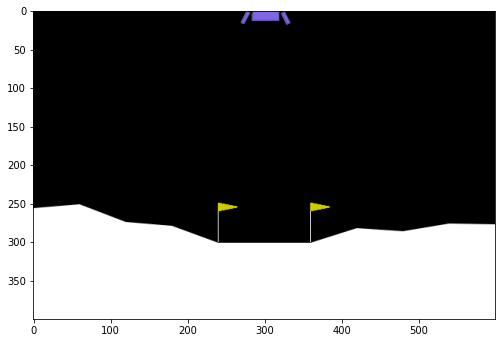

In [ ]:
# Импорт библиотек
from IPython import display
from pyvirtualdisplay import Display
import matplotlib.pyplot as plt
from matplotlib import animation

# Запуск виртуального дисплея
d = Display()
d.start()

# Создание среды Lunar Lander для тестирования
env = gym.make('LunarLander-v2', render_mode="rgb_array")

# Сброс среды и получение начального наблюдения
obs, info = env.reset()

# Цикл, в котором модель используется для прогнозирования действия
# Действие применяется к среде
# Текущий кадр среды записывается в виде изображения для создания анимации

# Запись изображения для создания анимации
img = []
for _ in range(1000):
    # Прогноз действия с использованием обученной модели
    action, _states = model.predict(obs, deterministic=True)
    # Применение действия к среде
    obs, reward, terminated, truncated, info = env.step(action)
    # Очистка вывода для анимации
    display.clear_output(wait=True)
    # Запись текущего кадра среды в виде изображения
    img.append(env.render())

# Параметры для создания анимации
dpi = 72
interval = 50 # ms

# Создание и отображение анимации
plt.figure(figsize=(img[0].shape[1]/dpi,img[0].shape[0]/dpi),dpi=dpi)
patch = plt.imshow(img[0])
plt.axis=('off')
animate = lambda i: patch.set_data(img[i])
ani = animation.FuncAnimation(plt.gcf(),animate,frames=len(img),interval=interval)
display.display(display.HTML(ani.to_jshtml()))

In [ ]:
# Закрытие среды после тестирования
env.close()

**Вывод**

Таким образом, в рамках лабораторной работы было продемонстрировано использование библиотек для работы с окружением OpenAI Gym, обучение модели глубокого обучения на примере задачи LunarLander и визуализация результатов обучения в Collab с использованием анимации.

Выполнена следующая последовательность действий:
- Установка библиотек для работы над лабораторной работы (Gym, Stable-Baselines3, PyVirtualDisplay, Xvfb)
- Импорт и настройка окружения (извлечение пространства наблюдений и пространства действий из среды LunarLander)
- Обучение модели (использован алгоритм DQN)
- Анимация и вывод результатов на дисплей
- Закрытие среды для освобождения ресурсов.